# RL Project Final Submission

# Installing Necessary Libs

In [15]:
!pip install gym
!pip install gym_anytrading
!pip install stable-baselines3[extra]
!pip install plotly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.2/182.2 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 434.7/434.7 kB 7.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 23.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nv

In [16]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Importing Libs

In [17]:
from stable_baselines3.ppo.policies import MlpPolicy
from stable_baselines3 import A2C, PPO, DQN
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.env_util import make_vec_env
import numpy as np
from matplotlib import pyplot as plt
from gym_anytrading.envs import TradingEnv, ForexEnv, StocksEnv, Actions, Positions
import tensorflow as tf
import gymnasium as gym
import gym_anytrading
from tensorflow.keras.layers import LSTM, Dense, Input, GRU, Dropout
from tensorflow.keras.models import Model
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler
import plotly.graph_objs as go
import plotly.subplots as subplots
import pandas as pd
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')
tf.get_logger().setLevel('ERROR')


In [18]:
np.random.seed(2)

# Dataset And Env Prep

## Importing Dataset

In [19]:
df = pd.read_csv('/content/drive/MyDrive/RL/KO.csv')
df = df.reset_index(drop=True)
df = df.set_index('Date')

df_Train = df[1500:4900].copy().astype('float64')
df_Test = df[4801:].copy().astype('float64')

print(df_Train.head())
print(df_Test.head())

                 Open       High        Low      Close      Volume
Date                                                              
13-04-2006  20.584999  20.715000  20.540001  20.629999   9029000.0
17-04-2006  20.650000  20.700001  20.430000  20.520000   9270800.0
18-04-2006  20.525000  20.745001  20.525000  20.650000  11528400.0
19-04-2006  20.740000  21.059999  20.700001  20.844999  16677600.0
20-04-2006  20.870001  21.120001  20.775000  20.905001  12246600.0
                 Open       High        Low      Close      Volume
Date                                                              
28-05-2019  49.599998  49.669998  49.029999  49.099998  18614000.0
29-05-2019  48.740002  49.029999  48.410000  48.610001  12534600.0
30-05-2019  48.720001  49.310001  48.669998  49.250000   9087200.0
31-05-2019  49.000000  49.310001  48.779999  49.130001  11368600.0
03-06-2019  49.160000  49.980000  49.020000  49.980000  14167200.0


## Normalizing Dataset

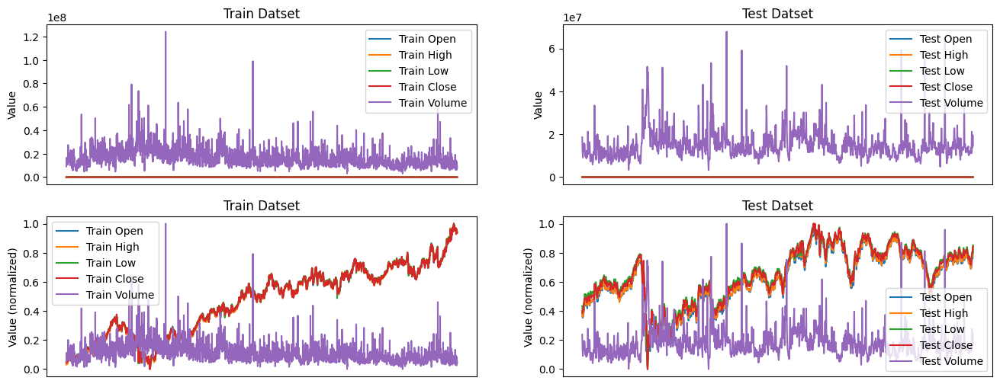

In [20]:
plt.figure(figsize=(16, 6))

plt.subplot(2,2,1)
for column in df_Train.columns:
    plt.plot(df_Train.index, df_Train[column], label=f'Train {column}')
plt.title('Train Datset')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.legend()
ax = plt.gca()
ax.get_xaxis().set_visible(False)

plt.subplot(2,2,2)
for column in df_Test.columns:
    plt.plot(df_Test.index, df_Test[column], label=f'Test {column}')
plt.title('Test Datset')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.legend()
ax = plt.gca()
ax.get_xaxis().set_visible(False)

scaler1 = MinMaxScaler()
df_Train_n = scaler1.fit_transform(df_Train)
df_Train_n = pd.DataFrame(df_Train_n, columns=df_Train.columns, index=df_Train.index)

scaler2 = MinMaxScaler()
df_Test_n = scaler2.fit_transform(df_Test)
df_Test_n = pd.DataFrame(df_Test_n, columns=df_Test.columns, index=df_Test.index)

plt.subplot(2,2,3)
for column in df_Test_n.columns:
    plt.plot(df_Train_n.index, df_Train_n[column], label=f'Train {column}')
plt.title('Train Datset')
plt.xlabel('Time Step')
plt.ylabel('Value (normalized)')
plt.legend()
ax = plt.gca()
ax.get_xaxis().set_visible(False)

plt.subplot(2,2,4)
for column in df_Test_n.columns:
    plt.plot(df_Test_n.index, df_Test_n[column], label=f'Test {column}')
plt.title('Test Datset')
plt.xlabel('Time Step')
plt.ylabel('Value (normalized)')
plt.legend()
ax = plt.gca()
ax.get_xaxis().set_visible(False)

plt.show()

## Defining functions to create env from base env

In [21]:
def my_process_data(df, df_n, window_size, frame_bound):
    start = frame_bound[0] - window_size
    end = frame_bound[1]
    prices = df.loc[:, 'Close'].to_numpy()[start:end]
    signal_features = df_n.loc[:, ['Close', 'Open', 'High', 'Low', 'Volume']].to_numpy()[start:end]
    return prices, signal_features


class MyStocksEnv(StocksEnv):
    def __init__(self, prices, signal_features, **kwargs):
        self._prices = prices
        self._signal_features = signal_features
        super().__init__(**kwargs)

    def _process_data(self):
        return self._prices, self._signal_features


def create_env(prices, signal_features, df, start_index, end_index, window_size):
    env = MyStocksEnv(prices, signal_features, df=df, window_size=window_size, frame_bound=(start_index, end_index))
    env.trade_fee = 0
    return env

def env_maker(prices, signal_features, df, start_index, end_index, window_size):
    return create_env(prices, signal_features, df, start_index, end_index, window_size)

## Creating test and train Envs

### Envs for baseline model

#### Train Env





In [22]:
prices_train, signal_features_train = my_process_data(df=df_Train, df_n=df_Train_n, window_size=100, frame_bound=(100, len(df_Train_n)))
env_train_b = make_vec_env(lambda: env_maker(prices_train, signal_features_train, df_Train, 100, len(df_Train), 100), n_envs=10)

#### Test Env





In [23]:
prices_test, signal_features_test = my_process_data(df=df_Test, df_n=df_Test_n, window_size=100, frame_bound=(100, len(df_Test_n)))
env_test_b = env_maker(prices_test, signal_features_test, df_Test, 100, len(df_Test), 100)

### Envs for custom model

#### Train Env

In [ ]:
prices_train, signal_features_train = my_process_data(df=df_Train, df_n=df_Train_n, window_size=100, frame_bound=(100, len(df_Train_n)))
env_train = MyStocksEnv(prices_train, signal_features_train, df=df_Train, window_size=100, frame_bound=(100, len(df_Train_n)))
env_train.trade_fee = 0

print("custom_env information:")
print("> shape:", env_train.unwrapped.shape)
print("> df.shape:", env_train.unwrapped.df.shape)
print("> prices.shape:", env_train.unwrapped.prices.shape)
print("> signal_features.shape:", env_train.unwrapped.signal_features.shape)
print("> Action Space:", env_train.unwrapped.action_space)

custom_env information:
> shape: (100, 5)
> df.shape: (3400, 5)
> prices.shape: (3400,)
> signal_features.shape: (3400, 5)
> Action Space: Discrete(2)


#### Test Env





In [ ]:
prices_test, signal_features_test = my_process_data(df=df_Test, df_n=df_Test_n, window_size=100, frame_bound=(100, len(df_Test_n)))
env_test = MyStocksEnv(prices_test, signal_features_test, df=df_Test, window_size=100, frame_bound=(100, len(df_Test_n)))
env_test.trade_fee = 0

print("custom_env information:")
print("> shape:", env_test.unwrapped.shape)
print("> df.shape:", env_test.unwrapped.df.shape)
print("> prices.shape:", env_test.unwrapped.prices.shape)
print("> signal_features.shape:", env_test.unwrapped.signal_features.shape)
print("> Action Space:", env_test.unwrapped.action_space)

custom_env information:
> shape: (100, 5)
> df.shape: (1238, 5)
> prices.shape: (1238,)
> signal_features.shape: (1238, 5)
> Action Space: Discrete(2)


# Training and Testing Baseline Model

## Defining Model Evlauation Function

In [24]:
def plot_eval_results(results, df_test, title, xlabel, ylabel):
    data = np.array(list(results.values()))
    means = np.mean(data, axis=0)
    stds = np.std(data, axis=0)

    x_range = list(range(len(means)))

    trace1 = go.Scatter(
        x=x_range,
        y=means,
        mode='markers',
        name='Mean Values',
        marker=dict(color='red'),
        error_y=dict(type='data', array=stds, visible=True, color='blue', thickness=1.5)
    )

    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
    fig.add_trace(trace1, row=1, col=1)

    for index, result_set in enumerate(data):
        trace2 = go.Scatter(
            x=x_range,
            y=result_set,
            mode='lines',
            name=f'Result Set {index + 1}'
        )
        fig.add_trace(trace2, row=2, col=1)


    fig.update_layout(
        xaxis1=dict(title=xlabel, tickangle=-45),
        yaxis1=dict(title=ylabel),
        xaxis2=dict(title='Time Step'),
        yaxis2=dict(title='Quality'),
        showlegend=True,
        title_text=title
    )

    fig.show()

def evla_baseline_model(env, model):
  result = {0: [],1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
  for i in range(10):
    obs, *info = env.reset()
    total_reward = 0
    while True:
        obs_array = obs if isinstance(obs, np.ndarray) else obs[0]
        obs_array = obs_array[np.newaxis, ...]
        action, _ = model.predict(obs_array)
        obs, reward, done, t, info = env.step(action)
        total_reward += reward
        result[i].append(total_reward)
        if done or t:
            break
    plt.figure(figsize=(30, 5))
    env.render_all()
    plt.show()

  plot_eval_results(result, df_Test_n, title='Quality Plot', xlabel='Time Step', ylabel='Quality')

## Training Baseline Model

In [25]:
baseline_model = PPO(MlpPolicy, env_train_b, verbose=1)
baseline_model.learn(total_timesteps=500000, progress_bar=True)

Using cuda device


Output()

------------------------------
| time/              |       |
|    fps             | 3623  |
|    iterations      | 1     |
|    time_elapsed    | 5     |
|    total_timesteps | 20480 |
------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 3.3e+03     |
|    ep_rew_mean          | 15.7        |
| time/                   |             |
|    fps                  | 1376        |
|    iterations           | 2           |
|    time_elapsed         | 29          |
|    total_timesteps      | 40960       |
| train/                  |             |
|    approx_kl            | 0.007065583 |
|    clip_fraction        | 0.0175      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.685      |
|    explained_variance   | 0.00679     |
|    learning_rate        | 0.0003      |
|    loss                 | 0.226       |
|    n_updates            | 10          |
|    policy_gradient_loss |

## Testing Baseline Model

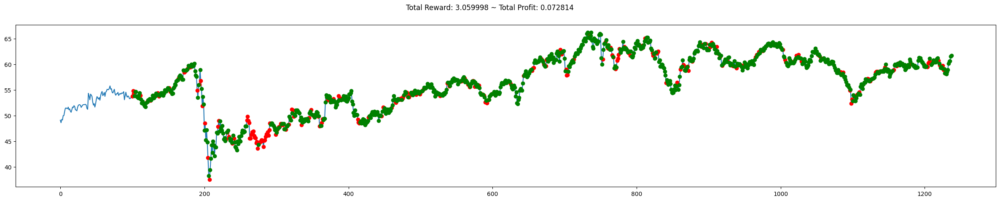

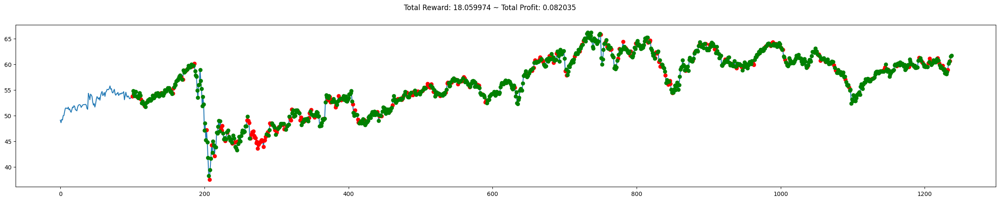

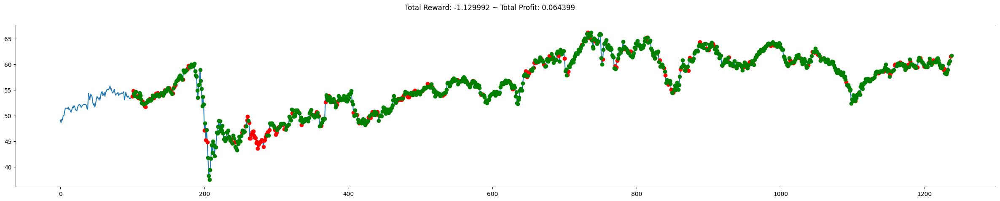

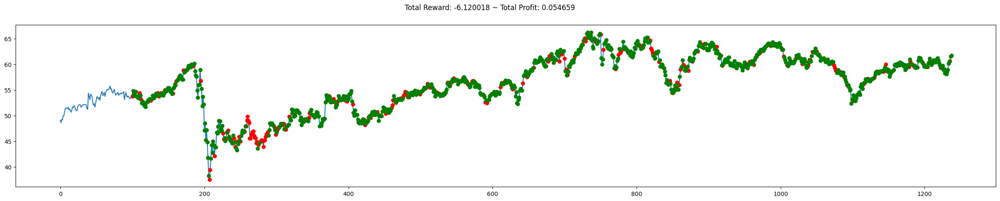

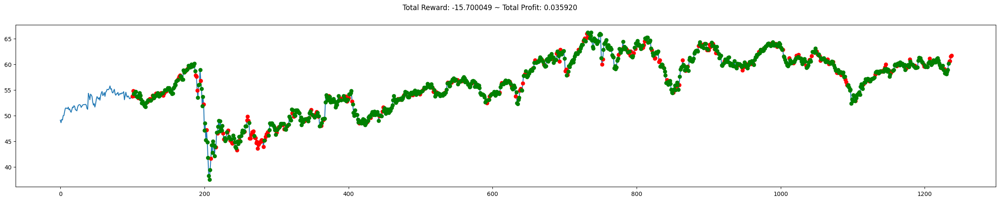

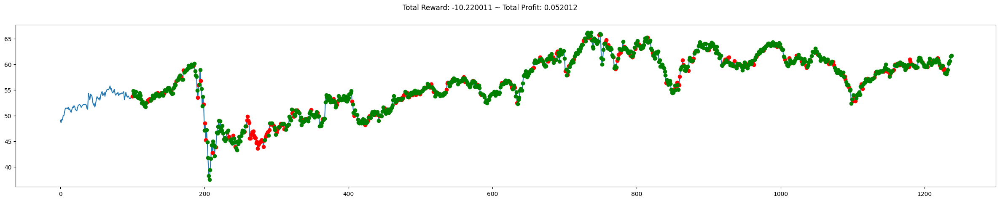

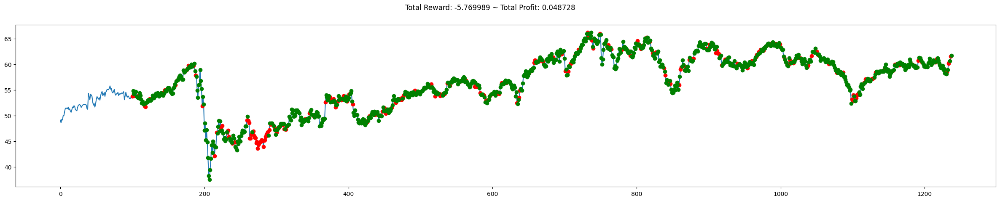

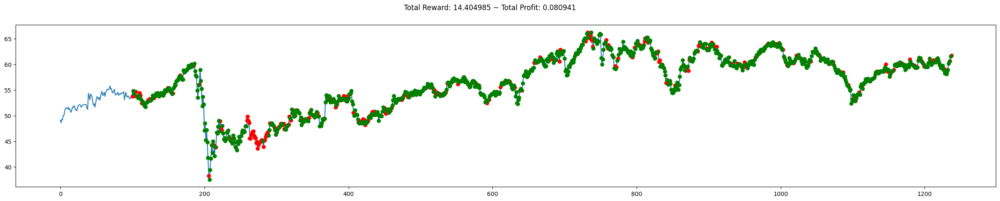

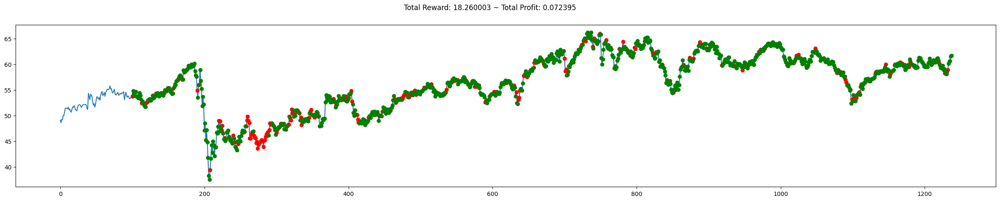

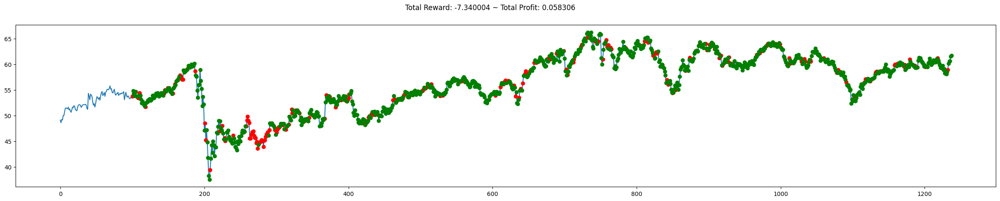

In [27]:
evla_baseline_model(env_test_b, baseline_model)

# Training and Testing Custom Model

## Defining Model Evlauation Function

In [ ]:
def plot_eval_results(results, df_test, title, xlabel, ylabel):
    data = np.array(list(results.values()))
    means = np.mean(data, axis=0)
    stds = np.std(data, axis=0)

    x_range = list(range(len(means)))

    trace1 = go.Scatter(
        x=x_range,
        y=means,
        mode='markers',
        name='Mean Values',
        marker=dict(color='red'),
        error_y=dict(type='data', array=stds, visible=True, color='blue', thickness=1.5)
    )

    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
    fig.add_trace(trace1, row=1, col=1)

    for index, result_set in enumerate(data):
        trace2 = go.Scatter(
            x=x_range,
            y=result_set,
            mode='lines',
            name=f'Result Set {index + 1}'
        )
        fig.add_trace(trace2, row=2, col=1)


    fig.update_layout(
        xaxis1=dict(title=xlabel, tickangle=-45),
        yaxis1=dict(title=ylabel),
        xaxis2=dict(title='Time Step'),
        yaxis2=dict(title='Quality'),
        showlegend=True,
        title_text=title
    )

    fig.show()


def evla_custom_model(env, actor, num_eval=10):
  result = {}
  for i in tqdm(range(num_eval)):
    state, _ = env.reset()
    total_reward = 0
    done = False
    result[i] = []
    while not done:
        state = np.expand_dims(state, axis=0)
        logits = actor(state)
        action_probs = tf.nn.softmax(logits, axis=-1)
        action_probs = tf.reduce_sum(action_probs, axis=0)
        action_probs = tf.reduce_sum(action_probs, axis=0)
        action_probs = action_probs.numpy()
        action_probs /= np.sum(action_probs)
        action = action = np.random.choice(env.action_space.n, p=action_probs)
        next_state, reward, truncated, done, info = env.step(action)
        total_reward += reward
        result[i].append(total_reward)
        state = next_state

        if done or truncated:
            break

    print(f"Total reward accumulated during the test: {total_reward}")
    plt.figure(figsize=(30, 5))
    env.render_all()
    plt.show()

  plot_eval_results(result, df_Test_n, title='Quality Plot', xlabel='Time Step', ylabel='Quality')

## Defining Actor Network, Crtic Network and PPO Algorithm

In [ ]:
## Actor Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
logits = Dense(env_train.action_space.n, activation='sigmoid')(dense)
actor = Model(inputs=inputs, outputs=logits)

## Critic Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
values = Dense(1, activation='sigmoid')(dense)
critic = Model(inputs=inputs, outputs=values)

## PPO Algorithm
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
huber_loss = tf.keras.losses.Huber()
entropy_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

## Defining Custom training loop

In [ ]:
def train_ppo(env, actor, critic, num_episodes):
    total_reward = []
    for episode in tqdm(range(num_episodes)):
        state, info = env.reset()
        episode_rewards = []
        states, actions, rewards, values, dones, old_probs = [], [], [], [], [], []

        while True:
            state = np.expand_dims(state, axis=0)
            logits = actor(state)
            action_probs = tf.nn.softmax(logits, axis=-1)
            action_probs = tf.reduce_sum(action_probs, axis=0)
            action_probs = tf.reduce_sum(action_probs, axis=0)
            action_probs = action_probs.numpy()
            action_probs /= np.sum(action_probs)


            action = np.random.choice(env.action_space.n, p=action_probs)
            chosen_prob = action_probs[action]

            value = critic(state)
            next_state, reward, truncated, done, info = env.step(action)

            states.append(state[0])
            actions.append(action)
            rewards.append(reward)
            values.append(value[0][0])
            dones.append(done or truncated)
            old_probs.append([chosen_prob, 1-chosen_prob])

            state = next_state
            episode_rewards.append(reward)

            if done or truncated:
                break

        returns, advantages = calculate_returns_and_advantages(rewards, values, dones)

        actions = tf.convert_to_tensor(actions, dtype=tf.int32)
        old_probs = tf.convert_to_tensor(old_probs, dtype=tf.float32)
        advantages = tf.convert_to_tensor(advantages, dtype=tf.float32)
        returns = tf.convert_to_tensor(returns, dtype=tf.float32)
        values = tf.convert_to_tensor(values, dtype=tf.float32)

        with tf.GradientTape() as tape:
            new_logits = actor(tf.convert_to_tensor(states))
            new_probs = tf.nn.softmax(new_logits, axis=-1)
            new_probs = tf.gather_nd(new_probs, tf.stack([tf.range(actions.shape[0]), actions], axis=1))
            loss = ppo_loss(old_probs, values, returns, actions, advantages, new_probs)

        gradients = tape.gradient(loss, actor.trainable_variables + critic.trainable_variables)
        optimizer.apply_gradients(zip(gradients, actor.trainable_variables + critic.trainable_variables))
        total_reward.append(sum(episode_rewards))
        print(f"Episode: {episode}, Total Reward: {sum(episode_rewards)}, loss: {loss}")
    print("total_reward: ",total_reward)
    return actor

def ppo_loss(old_probs, values, returns, actions, advantages, new_probs):
    old_probs = tf.reshape(old_probs, new_probs.shape)
    ratio = new_probs / old_probs
    p1 = ratio * tf.expand_dims(advantages, axis=-1)
    p2 = tf.clip_by_value(ratio, 2 - 0.4, 2 + 0.4) * tf.expand_dims(advantages, axis=-1)
    surrogate_loss = -tf.reduce_mean(tf.minimum(p1, p2))
    value_loss = huber_loss(values, returns)
    total_loss = surrogate_loss + 0.5 * value_loss
    return total_loss

def calculate_returns_and_advantages(rewards, values, dones, discount_factor=0.99, lambda_=0.95):
    num_steps = len(rewards)
    returns = np.zeros(num_steps)
    advantages = np.zeros(num_steps)
    next_value = 0
    gae = 0

    for t in reversed(range(num_steps)):
        if dones[t]:
            delta = rewards[t] - values[t]
            next_value = 0
            gae = 0
        else:
            delta = rewards[t] + discount_factor * next_value - values[t]
        gae = delta + discount_factor * lambda_ * gae
        advantages[t] = gae
        returns[t] = gae + values[t]
        next_value = values[t]

    return returns, advantages

## Training Custom Model

In [ ]:
train_ppo(env_train, actor, critic, num_episodes=20)

  5%|▌         | 1/20 [03:24<1:04:47, 204.63s/it]

Episode: 0, Total Reward: 27.510002000000114, loss: 0.22171959280967712


 10%|█         | 2/20 [06:42<1:00:10, 200.61s/it]

Episode: 1, Total Reward: 14.189949000000045, loss: 0.2975260317325592


 15%|█▌        | 3/20 [10:00<56:30, 199.43s/it]  

Episode: 2, Total Reward: 13.152489999999965, loss: 0.3132985830307007


 20%|██        | 4/20 [13:17<52:54, 198.43s/it]

Episode: 3, Total Reward: -4.955025000000003, loss: 0.4094175100326538


 25%|██▌       | 5/20 [16:35<49:32, 198.16s/it]

Episode: 4, Total Reward: 17.96742200000001, loss: 0.27828267216682434


 30%|███       | 6/20 [19:52<46:12, 198.03s/it]

Episode: 5, Total Reward: -7.595078999999924, loss: 0.41990160942077637


 35%|███▌      | 7/20 [23:10<42:53, 197.99s/it]

Episode: 6, Total Reward: -7.607486000000112, loss: 0.41189613938331604


 40%|████      | 8/20 [26:31<39:45, 198.81s/it]

Episode: 7, Total Reward: -0.8962889999999071, loss: 0.3679235875606537


 45%|████▌     | 9/20 [29:48<36:22, 198.43s/it]

Episode: 8, Total Reward: -9.562497999999866, loss: 0.40834614634513855


 50%|█████     | 10/20 [33:11<33:17, 199.71s/it]

Episode: 9, Total Reward: 27.32622799999988, loss: 0.280398964881897


 55%|█████▌    | 11/20 [36:29<29:51, 199.10s/it]

Episode: 10, Total Reward: 12.784976999999959, loss: 0.3006227910518646


 60%|██████    | 12/20 [39:47<26:29, 198.74s/it]

Episode: 11, Total Reward: 11.28628699999991, loss: 0.3306584060192108


 65%|██████▌   | 13/20 [43:04<23:09, 198.47s/it]

Episode: 12, Total Reward: 30.05749199999996, loss: 0.24270540475845337


 70%|███████   | 14/20 [46:23<19:51, 198.55s/it]

Episode: 13, Total Reward: 4.858740000000012, loss: 0.37617507576942444


 75%|███████▌  | 15/20 [49:41<16:31, 198.21s/it]

Episode: 14, Total Reward: 48.30116200000005, loss: 0.15290775895118713


 80%|████████  | 16/20 [52:58<13:12, 198.06s/it]

Episode: 15, Total Reward: 8.432515000000038, loss: 0.34455397725105286


 85%|████████▌ | 17/20 [56:17<09:54, 198.17s/it]

Episode: 16, Total Reward: 11.198747999999991, loss: 0.3199884295463562


 90%|█████████ | 18/20 [59:34<06:35, 197.94s/it]

Episode: 17, Total Reward: 8.04245299999993, loss: 0.3473508954048157


 95%|█████████▌| 19/20 [1:02:50<03:17, 197.41s/it]

Episode: 18, Total Reward: 10.219895999999952, loss: 0.35297995805740356


100%|██████████| 20/20 [1:06:06<00:00, 198.30s/it]

Episode: 19, Total Reward: 7.15991600000012, loss: 0.34665247797966003
total_reward:  [27.510002000000114, 14.189949000000045, 13.152489999999965, -4.955025000000003, 17.96742200000001, -7.595078999999924, -7.607486000000112, -0.8962889999999071, -9.562497999999866, 27.32622799999988, 12.784976999999959, 11.28628699999991, 30.05749199999996, 4.858740000000012, 48.30116200000005, 8.432515000000038, 11.198747999999991, 8.04245299999993, 10.219895999999952, 7.15991600000012]


## Testing Custom Model

  0%|          | 0/10 [00:00<?, ?it/s]

Total reward accumulated during the test: 10.330020000000111


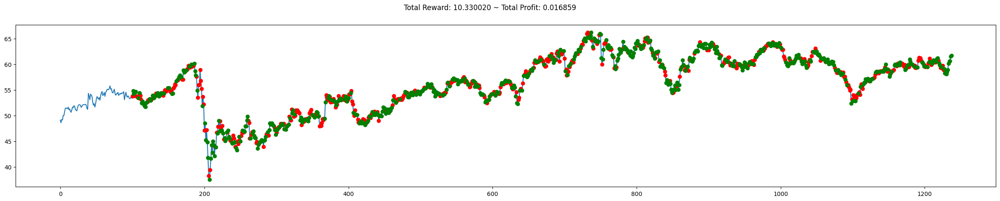

 10%|█         | 1/10 [00:22<03:24, 22.75s/it]

Total reward accumulated during the test: -4.590031000000067


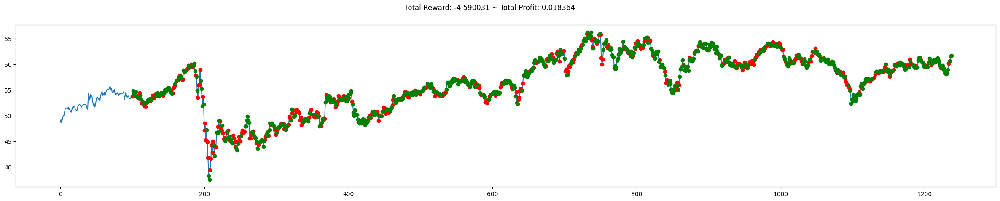

 20%|██        | 2/10 [00:45<03:02, 22.83s/it]

Total reward accumulated during the test: 7.799973999999935


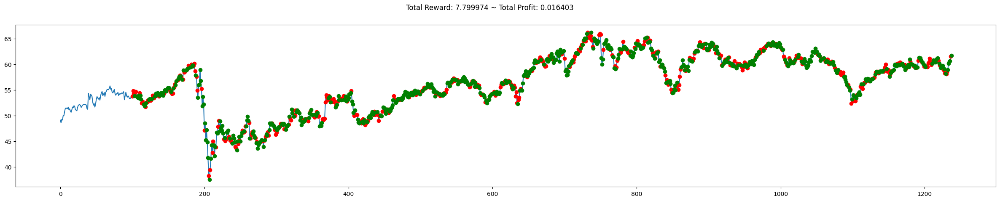

 30%|███       | 3/10 [01:07<02:37, 22.54s/it]

Total reward accumulated during the test: -3.060033999999959


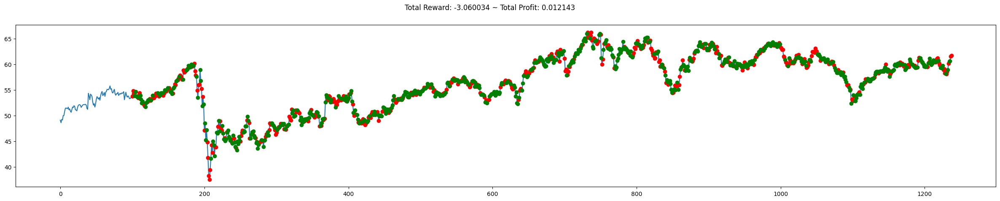

 40%|████      | 4/10 [01:30<02:15, 22.60s/it]

Total reward accumulated during the test: 2.539982999999957


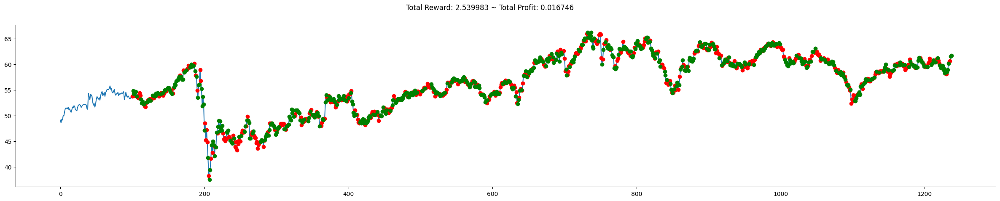

 50%|█████     | 5/10 [01:54<01:54, 22.97s/it]

Total reward accumulated during the test: 9.289967999999995


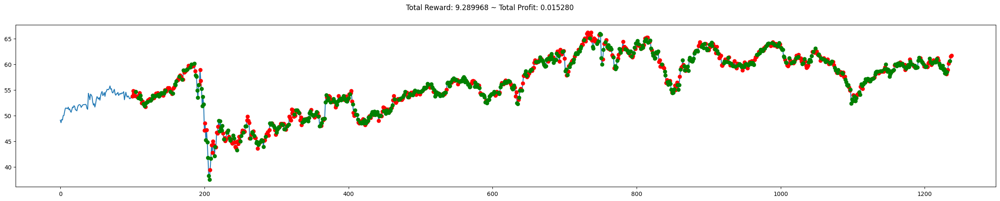

 60%|██████    | 6/10 [02:16<01:31, 22.92s/it]

Total reward accumulated during the test: 11.86503899999991


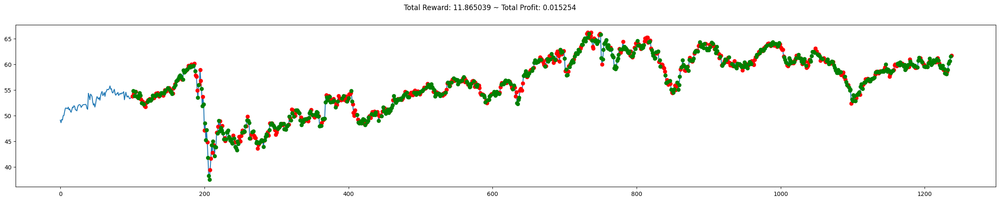

 70%|███████   | 7/10 [02:39<01:08, 22.94s/it]

Total reward accumulated during the test: -14.780012999999933


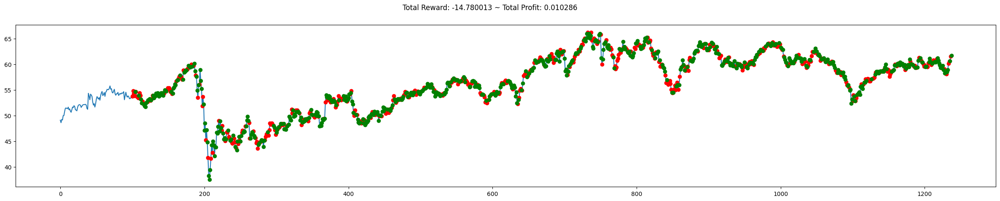

 80%|████████  | 8/10 [03:02<00:45, 22.71s/it]

Total reward accumulated during the test: 11.79997400000002


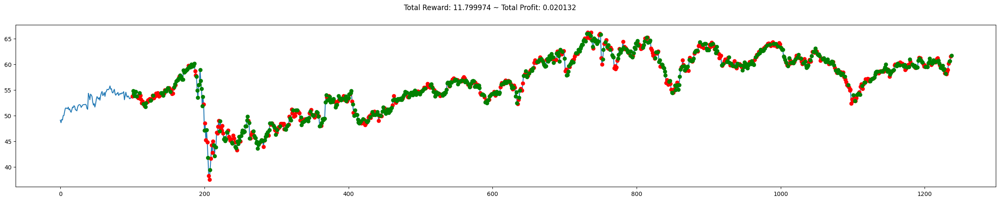

 90%|█████████ | 9/10 [03:25<00:22, 22.79s/it]

Total reward accumulated during the test: -0.4499540000000479


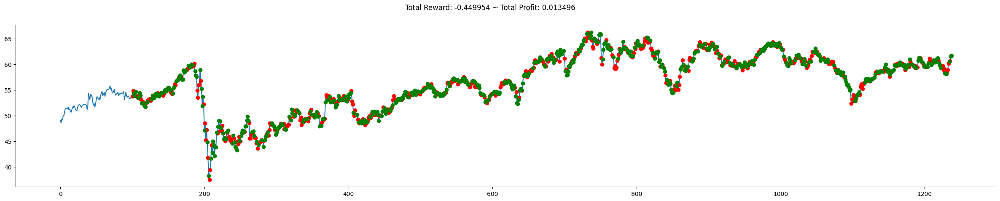

100%|██████████| 10/10 [03:47<00:00, 22.80s/it]


In [ ]:
evla_custom_model(env_test, actor, num_eval=10)

# Modifying Custom Model Hyperparameters

* Increasing No of layers
* Increasing No of LSTM Units
* Training longer
* Training shorter

All the Hyperparameters tweaking is done on Custom Baseline model

## Increasing No of layers

### Defining Custom Model - Increasing No of layers

In [ ]:
## Actor Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(512, activation='relu')(lstm)
dense = Dense(256, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
logits = Dense(env_train.action_space.n, activation='sigmoid')(dense)
actor = Model(inputs=inputs, outputs=logits)

## Critic Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(512, activation='relu')(lstm)
dense = Dense(256, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
values = Dense(1, activation='relu')(dense)
critic = Model(inputs=inputs, outputs=values)

## PPO Algorithm
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
huber_loss = tf.keras.losses.Huber()
entropy_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

### Training Custom Model

In [ ]:
train_ppo(env_train, actor, critic, num_episodes=20)

  5%|▌         | 1/20 [03:32<1:07:18, 212.57s/it]

Episode: 0, Total Reward: -2.825069999999961, loss: 0.2795037627220154


 10%|█         | 2/20 [06:51<1:01:25, 204.75s/it]

Episode: 1, Total Reward: 9.025011000000077, loss: 0.187070831656456


 15%|█▌        | 3/20 [10:09<57:05, 201.51s/it]  

Episode: 2, Total Reward: 36.035074999999814, loss: 0.03765786439180374


 20%|██        | 4/20 [13:29<53:31, 200.72s/it]

Episode: 3, Total Reward: 37.74992800000009, loss: 0.034309834241867065


 25%|██▌       | 5/20 [16:46<49:52, 199.49s/it]

Episode: 4, Total Reward: 5.054971000000009, loss: 0.20448113977909088


 30%|███       | 6/20 [20:04<46:26, 199.02s/it]

Episode: 5, Total Reward: 27.034967999999925, loss: 0.09286543726921082


 35%|███▌      | 7/20 [23:23<43:08, 199.09s/it]

Episode: 6, Total Reward: 23.914944000000073, loss: 0.11751151829957962


 40%|████      | 8/20 [26:41<39:45, 198.78s/it]

Episode: 7, Total Reward: 23.890051000000014, loss: 0.11327985674142838


 45%|████▌     | 9/20 [30:00<36:25, 198.68s/it]

Episode: 8, Total Reward: 27.665046000000185, loss: 0.08998788148164749


 50%|█████     | 10/20 [33:18<33:06, 198.63s/it]

Episode: 9, Total Reward: 18.369963000000084, loss: 0.1321900337934494


 55%|█████▌    | 11/20 [36:37<29:46, 198.53s/it]

Episode: 10, Total Reward: 0.29004099999995603, loss: 0.23607920110225677


 60%|██████    | 12/20 [39:55<26:27, 198.45s/it]

Episode: 11, Total Reward: -0.5800740000000602, loss: 0.25328826904296875


 65%|██████▌   | 13/20 [43:15<23:12, 198.93s/it]

Episode: 12, Total Reward: 3.8949979999999798, loss: 0.20937314629554749


 70%|███████   | 14/20 [46:35<19:55, 199.23s/it]

Episode: 13, Total Reward: 21.914964999999984, loss: 0.10979001969099045


 75%|███████▌  | 15/20 [49:55<16:37, 199.58s/it]

Episode: 14, Total Reward: 28.4050280000001, loss: 0.06293777376413345


 80%|████████  | 16/20 [53:15<13:18, 199.74s/it]

Episode: 15, Total Reward: 5.990043000000011, loss: 0.19013310968875885


 85%|████████▌ | 17/20 [56:34<09:58, 199.49s/it]

Episode: 16, Total Reward: 24.78497800000002, loss: 0.09095684438943863


 90%|█████████ | 18/20 [59:58<06:41, 200.89s/it]

Episode: 17, Total Reward: 4.234942000000071, loss: 0.2399795651435852


 95%|█████████▌| 19/20 [1:03:21<03:21, 201.42s/it]

Episode: 18, Total Reward: 31.544986999999907, loss: 0.06328408420085907


100%|██████████| 20/20 [1:06:42<00:00, 200.14s/it]

Episode: 19, Total Reward: 4.780018000000027, loss: 0.24433934688568115
total_reward:  [-2.825069999999961, 9.025011000000077, 36.035074999999814, 37.74992800000009, 5.054971000000009, 27.034967999999925, 23.914944000000073, 23.890051000000014, 27.665046000000185, 18.369963000000084, 0.29004099999995603, -0.5800740000000602, 3.8949979999999798, 21.914964999999984, 28.4050280000001, 5.990043000000011, 24.78497800000002, 4.234942000000071, 31.544986999999907, 4.780018000000027]


### Testing Custom Model

  0%|          | 0/10 [00:00<?, ?it/s]

Total reward accumulated during the test: -6.1850359999999185


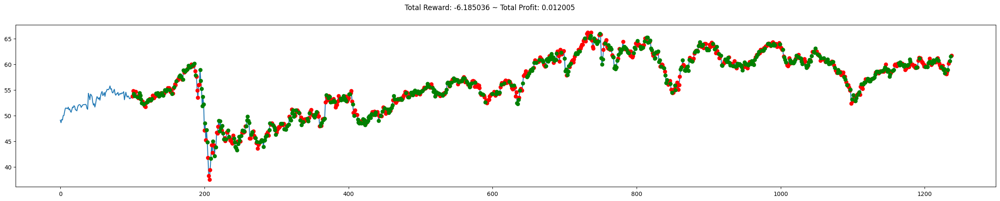

 10%|█         | 1/10 [00:30<04:32, 30.28s/it]

Total reward accumulated during the test: -2.5400709999999407


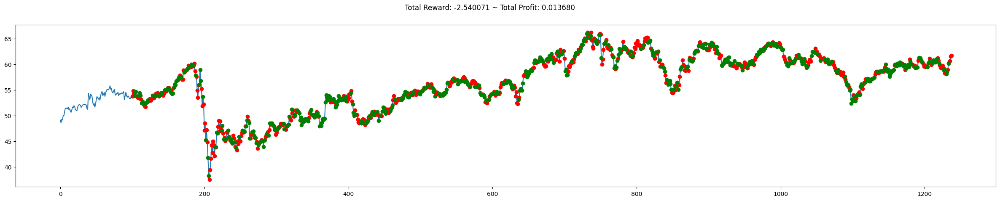

 20%|██        | 2/10 [01:00<04:00, 30.02s/it]

Total reward accumulated during the test: -1.3699779999999393


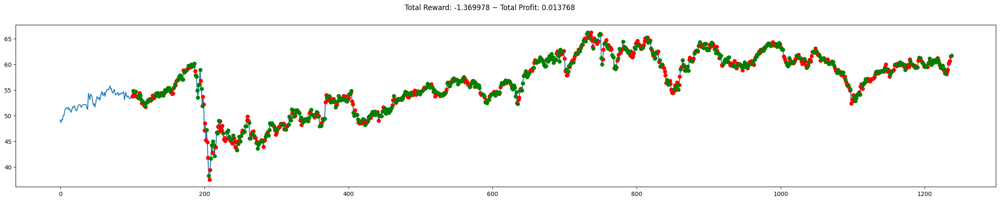

 30%|███       | 3/10 [01:29<03:27, 29.63s/it]

Total reward accumulated during the test: -1.7499359999999626


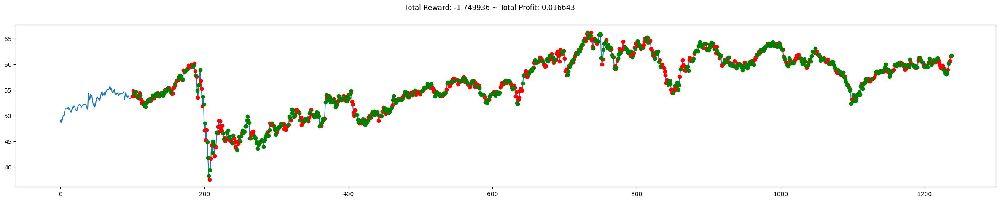

 40%|████      | 4/10 [01:58<02:57, 29.57s/it]

Total reward accumulated during the test: -5.859988000000037


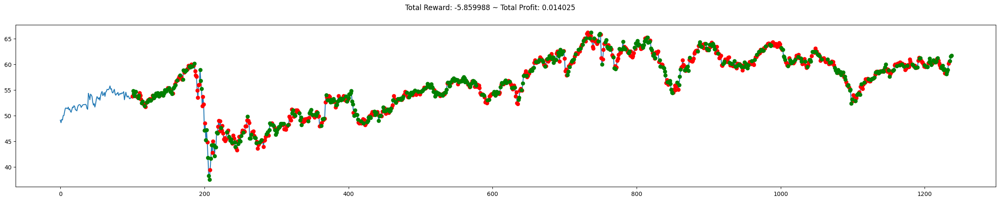

 50%|█████     | 5/10 [02:29<02:29, 29.89s/it]

Total reward accumulated during the test: 0.8500030000000294


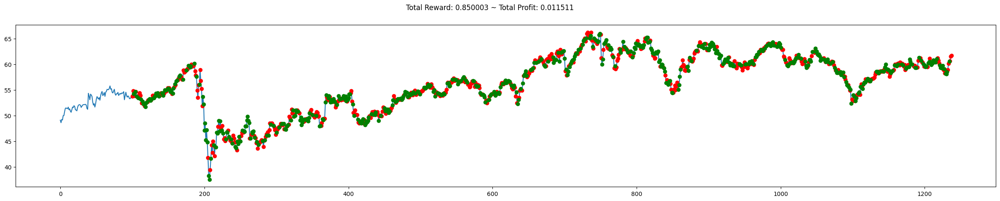

 60%|██████    | 6/10 [02:58<01:59, 29.85s/it]

Total reward accumulated during the test: 6.700020999999893


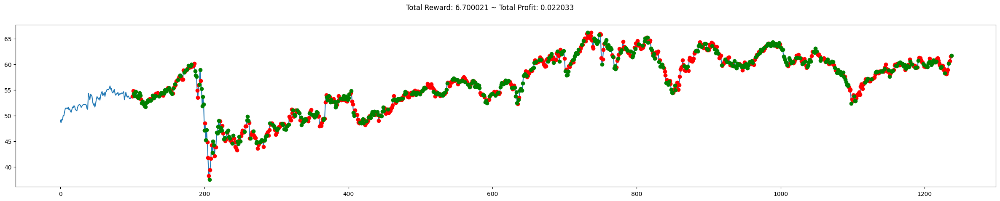

 70%|███████   | 7/10 [03:30<01:30, 30.30s/it]

Total reward accumulated during the test: 19.27996000000001


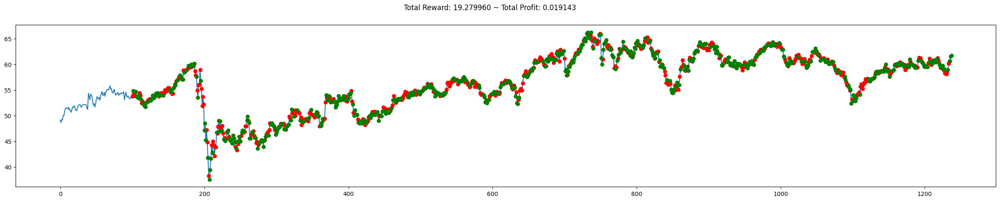

 80%|████████  | 8/10 [03:59<01:00, 30.10s/it]

Total reward accumulated during the test: 21.31001000000002


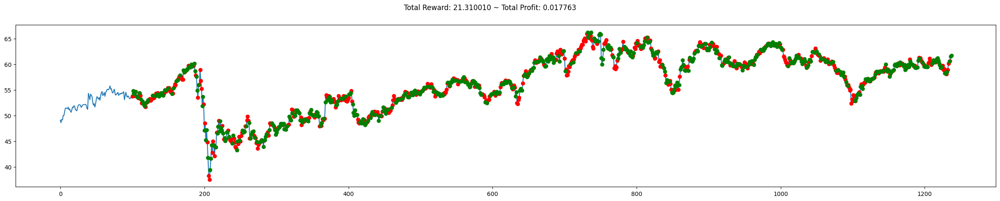

 90%|█████████ | 9/10 [04:29<00:29, 29.83s/it]

Total reward accumulated during the test: -2.510015999999986


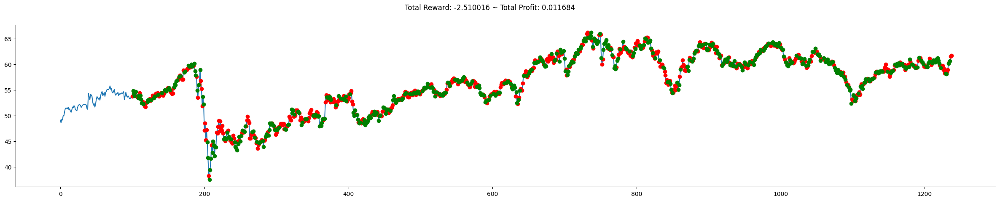

100%|██████████| 10/10 [04:59<00:00, 29.94s/it]


In [ ]:
evla_custom_model(env_test, actor)

## Increasing No of LSTM Units

### Defining Custom Model - Increasing No of LSTM Units

In [ ]:
## Actor Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(512, return_sequences=True)(inputs)
dense = Dense(1024, activation='relu')(lstm)
logits = Dense(env_train.action_space.n, activation='sigmoid')(dense)
actor = Model(inputs=inputs, outputs=logits)

## Critic Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(512, return_sequences=True)(inputs)
dense = Dense(1024, activation='relu')(lstm)
values = Dense(1, activation='relu')(dense)
critic = Model(inputs=inputs, outputs=values)

## PPO Algorithm
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
huber_loss = tf.keras.losses.Huber()
entropy_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

### Training Custom Model

In [ ]:
train_ppo(env_train, actor, critic, num_episodes=20)

  5%|▌         | 1/20 [01:17<24:40, 77.93s/it]

Episode: 0, Total Reward: 18.22000199999986, loss: 0.1330803632736206


 10%|█         | 2/20 [02:34<23:10, 77.27s/it]

Episode: 1, Total Reward: 14.81496600000018, loss: 0.19650159776210785


 15%|█▌        | 3/20 [03:48<21:26, 75.68s/it]

Episode: 2, Total Reward: 12.65489500000006, loss: 0.21283717453479767


 20%|██        | 4/20 [05:03<20:06, 75.39s/it]

Episode: 3, Total Reward: 17.195042000000093, loss: 0.18984393775463104


 25%|██▌       | 5/20 [06:17<18:43, 74.93s/it]

Episode: 4, Total Reward: 23.099941999999974, loss: 0.09643150120973587


 30%|███       | 6/20 [07:32<17:30, 75.07s/it]

Episode: 5, Total Reward: 18.695057999999953, loss: 0.1469658762216568


 35%|███▌      | 7/20 [08:51<16:29, 76.10s/it]

Episode: 6, Total Reward: 6.589961999999961, loss: 0.22495049238204956


 40%|████      | 8/20 [10:05<15:06, 75.56s/it]

Episode: 7, Total Reward: 11.619986000000154, loss: 0.19321487843990326


 45%|████▌     | 9/20 [11:19<13:47, 75.19s/it]

Episode: 8, Total Reward: 9.44004200000002, loss: 0.21052592992782593


 50%|█████     | 10/20 [12:33<12:28, 74.82s/it]

Episode: 9, Total Reward: -0.6549220000000453, loss: 0.2702012062072754


 55%|█████▌    | 11/20 [13:49<11:15, 75.04s/it]

Episode: 10, Total Reward: 29.54499299999998, loss: 0.09609939157962799


 60%|██████    | 12/20 [15:03<09:57, 74.69s/it]

Episode: 11, Total Reward: 26.77995199999984, loss: 0.0633186399936676


 65%|██████▌   | 13/20 [16:18<08:43, 74.82s/it]

Episode: 12, Total Reward: 16.93996000000006, loss: 0.12937362492084503


 70%|███████   | 14/20 [17:31<07:26, 74.40s/it]

Episode: 13, Total Reward: 5.275014000000066, loss: 0.20026354491710663


 75%|███████▌  | 15/20 [18:46<06:11, 74.36s/it]

Episode: 14, Total Reward: 2.7400709999999115, loss: 0.23531055450439453


 80%|████████  | 16/20 [19:58<04:54, 73.74s/it]

Episode: 15, Total Reward: -2.2051419999999666, loss: 0.2188824713230133


 85%|████████▌ | 17/20 [21:12<03:41, 73.95s/it]

Episode: 16, Total Reward: -4.195007999999948, loss: 0.24766413867473602


 90%|█████████ | 18/20 [22:26<02:27, 73.80s/it]

Episode: 17, Total Reward: 6.755040999999952, loss: 0.1656167060136795


 95%|█████████▌| 19/20 [23:40<01:14, 74.01s/it]

Episode: 18, Total Reward: 11.705023999999927, loss: 0.12825211882591248


100%|██████████| 20/20 [24:53<00:00, 74.66s/it]

Episode: 19, Total Reward: 31.814956000000038, loss: 0.012964576482772827
total_reward:  [18.22000199999986, 14.81496600000018, 12.65489500000006, 17.195042000000093, 23.099941999999974, 18.695057999999953, 6.589961999999961, 11.619986000000154, 9.44004200000002, -0.6549220000000453, 29.54499299999998, 26.77995199999984, 16.93996000000006, 5.275014000000066, 2.7400709999999115, -2.2051419999999666, -4.195007999999948, 6.755040999999952, 11.705023999999927, 31.814956000000038]


### Testing Custom Model

  0%|          | 0/10 [00:00<?, ?it/s]

Total reward accumulated during the test: 1.255052000000049


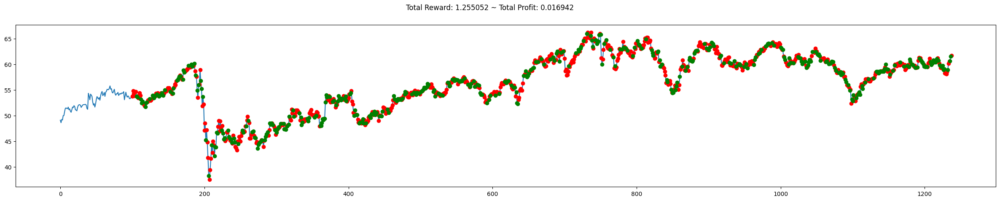

 10%|█         | 1/10 [00:12<01:50, 12.32s/it]

Total reward accumulated during the test: 0.8500139999999163


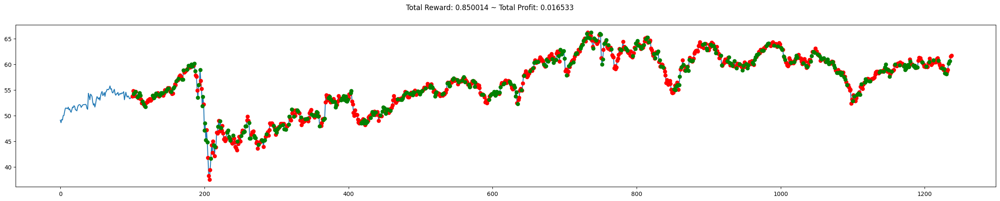

 20%|██        | 2/10 [00:24<01:39, 12.40s/it]

Total reward accumulated during the test: -12.929974999999999


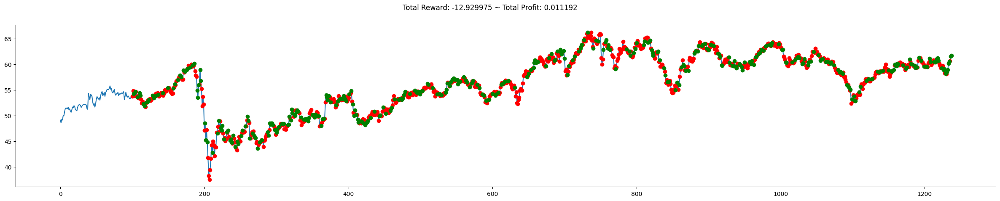

 30%|███       | 3/10 [00:37<01:27, 12.47s/it]

Total reward accumulated during the test: 13.014991999999957


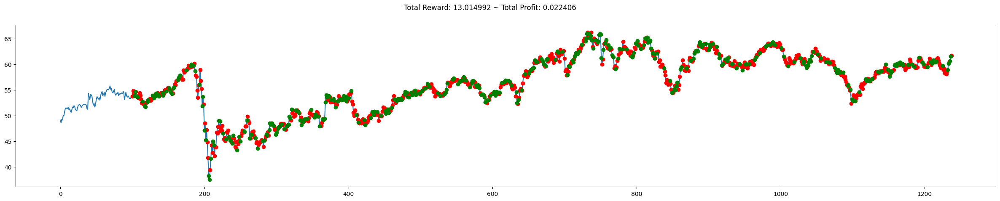

 40%|████      | 4/10 [00:51<01:19, 13.27s/it]

Total reward accumulated during the test: -9.999997999999913


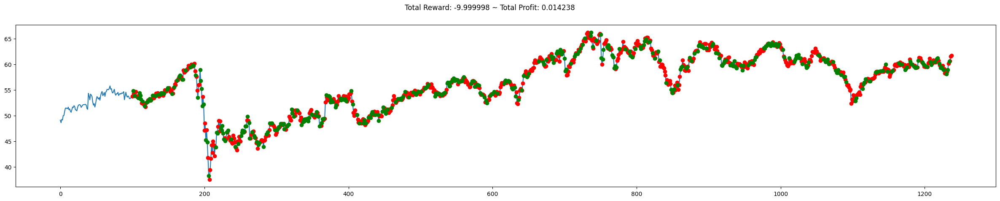

 50%|█████     | 5/10 [01:04<01:04, 12.95s/it]

Total reward accumulated during the test: -10.104990999999906


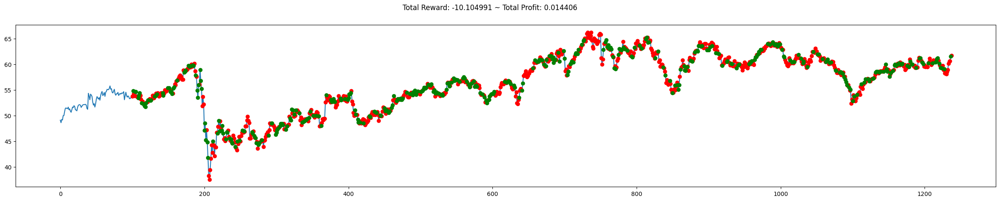

 60%|██████    | 6/10 [01:16<00:50, 12.74s/it]

Total reward accumulated during the test: 1.350016000000032


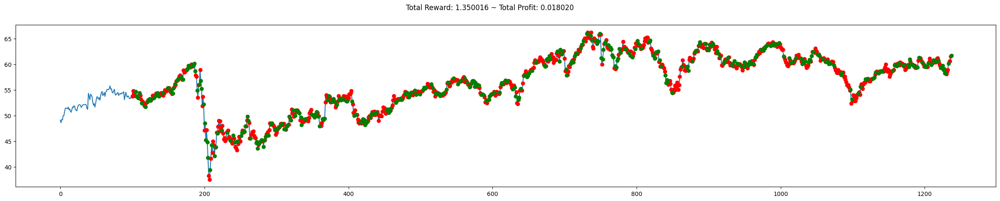

 70%|███████   | 7/10 [01:28<00:37, 12.62s/it]

Total reward accumulated during the test: -4.519955999999958


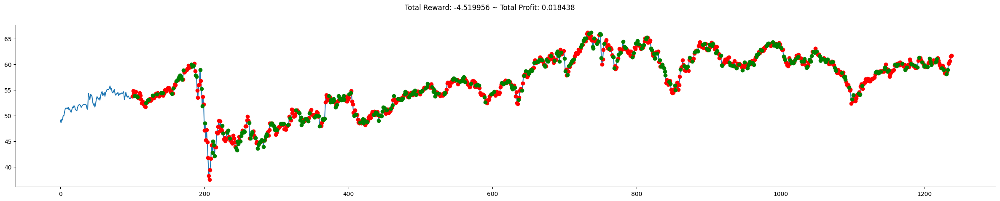

 80%|████████  | 8/10 [01:41<00:24, 12.45s/it]

Total reward accumulated during the test: 1.3499540000001105


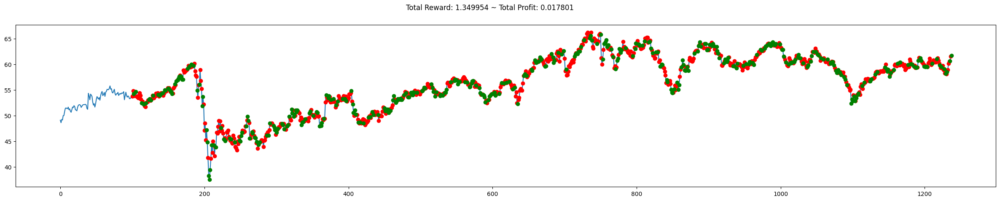

 90%|█████████ | 9/10 [01:53<00:12, 12.37s/it]

Total reward accumulated during the test: -7.684988000000018


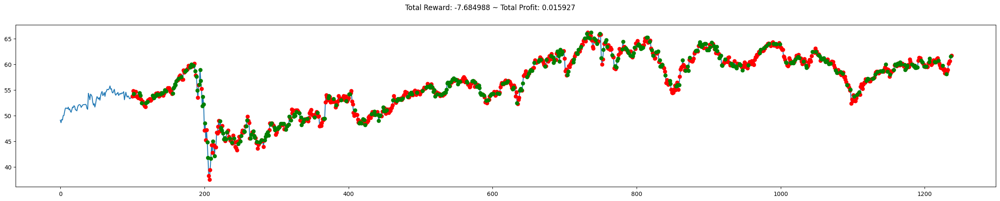

100%|██████████| 10/10 [02:05<00:00, 12.54s/it]


In [ ]:
evla_custom_model(env_test, actor)

## Training the model shorter duration (epoch = 5)

### Defining Custom Model - shorter training duration

In [ ]:
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
logits = Dense(env_train.action_space.n, activation='sigmoid')(dense)
actor = Model(inputs=inputs, outputs=logits)

## Critic Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
values = Dense(1, activation='sigmoid')(dense)
critic = Model(inputs=inputs, outputs=values)

## PPO Algorithm
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
huber_loss = tf.keras.losses.Huber()
entropy_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

### Training Custom Model

In [ ]:
train_ppo(env_train, actor, critic, num_episodes=5)

 20%|██        | 1/5 [03:21<13:25, 201.42s/it]

Episode: 0, Total Reward: 26.665001000000125, loss: 0.22403362393379211


 40%|████      | 2/5 [06:42<10:03, 201.05s/it]

Episode: 1, Total Reward: 15.109945000000057, loss: 0.29278481006622314


 60%|██████    | 3/5 [09:58<06:38, 199.09s/it]

Episode: 2, Total Reward: 13.457486999999968, loss: 0.31221193075180054


 80%|████████  | 4/5 [13:13<03:17, 197.22s/it]

Episode: 3, Total Reward: -5.585033000000003, loss: 0.41339296102523804


100%|██████████| 5/5 [16:26<00:00, 197.36s/it]

Episode: 4, Total Reward: 17.78242400000002, loss: 0.2790798246860504
total_reward:  [26.665001000000125, 15.109945000000057, 13.457486999999968, -5.585033000000003, 17.78242400000002]


### Testing Custom Model

  0%|          | 0/10 [00:00<?, ?it/s]

Total reward accumulated during the test: 15.42996599999993


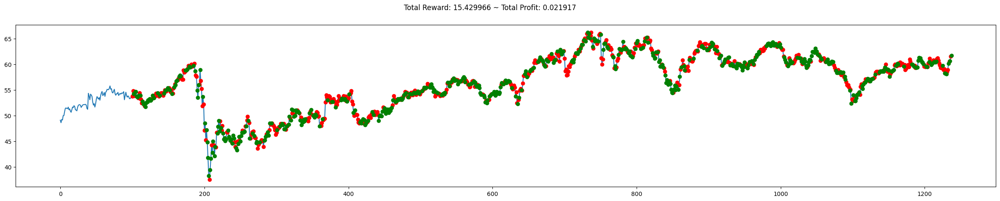

 10%|█         | 1/10 [00:22<03:18, 22.01s/it]

Total reward accumulated during the test: -17.090034999999922


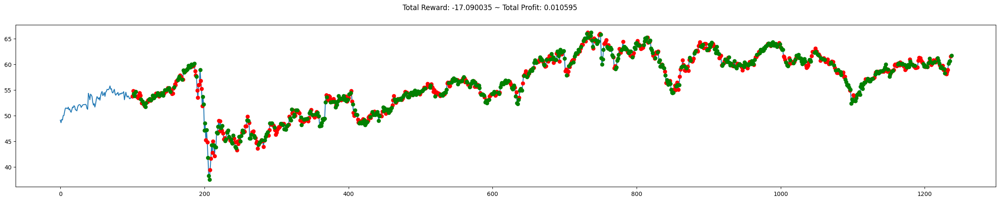

 20%|██        | 2/10 [00:44<03:00, 22.54s/it]

Total reward accumulated during the test: 10.84996899999998


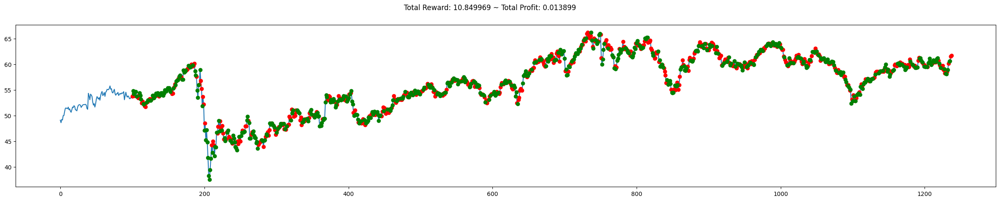

 30%|███       | 3/10 [01:08<02:39, 22.85s/it]

Total reward accumulated during the test: 11.940022000000099


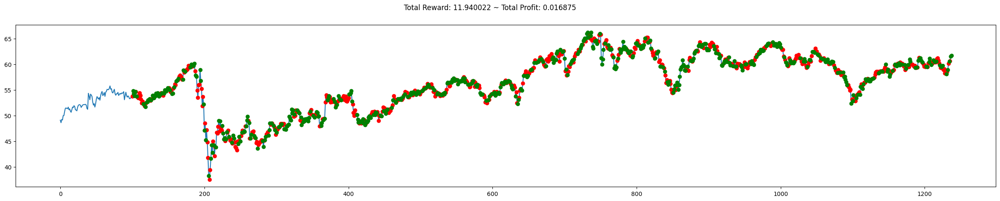

 40%|████      | 4/10 [01:31<02:17, 22.86s/it]

Total reward accumulated during the test: 12.480010000000043


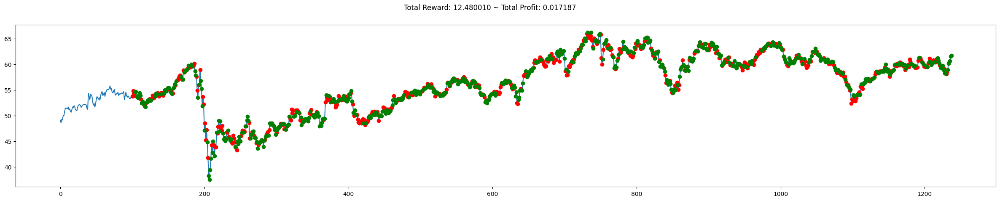

 50%|█████     | 5/10 [01:53<01:53, 22.76s/it]

Total reward accumulated during the test: 6.039998999999959


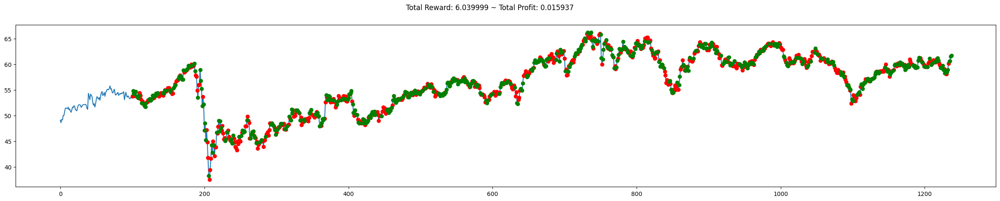

 60%|██████    | 6/10 [02:15<01:30, 22.57s/it]

Total reward accumulated during the test: -0.044963000000059594


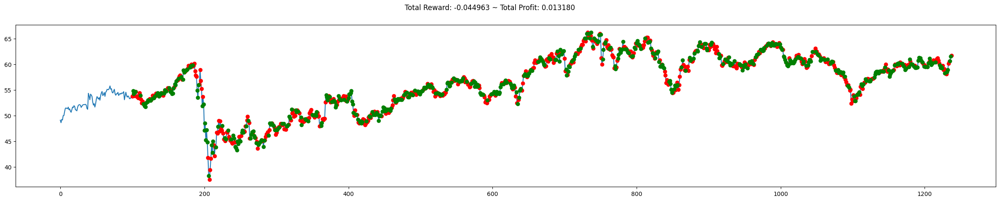

 70%|███████   | 7/10 [02:39<01:08, 22.92s/it]

Total reward accumulated during the test: 2.9500249999998545


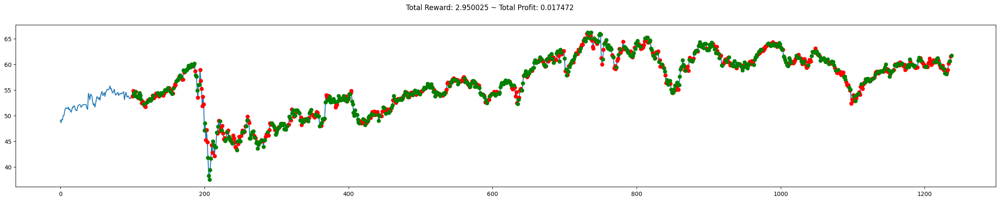

 80%|████████  | 8/10 [03:01<00:45, 22.80s/it]

Total reward accumulated during the test: 0.439949000000027


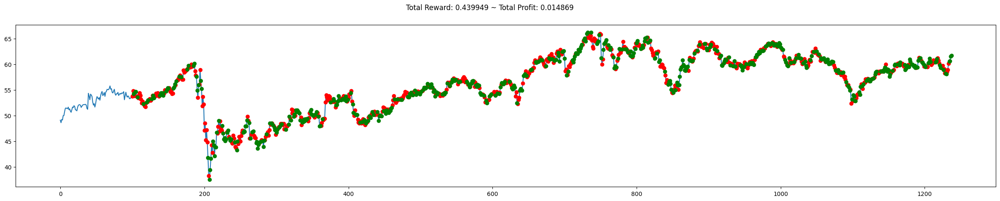

 90%|█████████ | 9/10 [03:24<00:22, 22.78s/it]

Total reward accumulated during the test: 2.8899949999999848


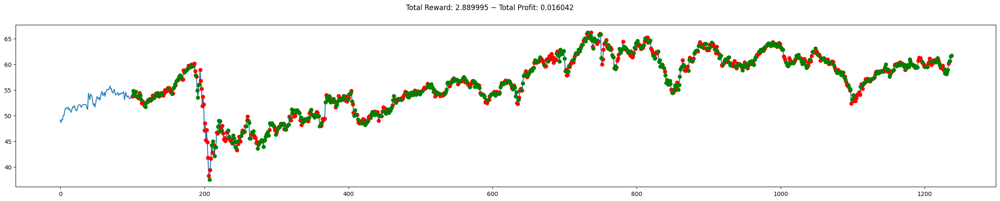

100%|██████████| 10/10 [03:47<00:00, 22.76s/it]


In [ ]:
evla_custom_model(env_test, actor)

## Training the model longer duration (epoch = 50)

### Defining Custom Model - longer training duration

In [ ]:
## Actor Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
logits = Dense(env_train.action_space.n, activation='sigmoid')(dense)
actor = Model(inputs=inputs, outputs=logits)

## Critic Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
values = Dense(1, activation='sigmoid')(dense)
critic = Model(inputs=inputs, outputs=values)

## PPO Algorithm
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
huber_loss = tf.keras.losses.Huber()
entropy_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

### Training Custom Model

In [ ]:
train_ppo(env_train, actor, critic, num_episodes=50)

  2%|▏         | 1/50 [03:18<2:42:17, 198.72s/it]

Episode: 0, Total Reward: 27.03500400000012, loss: 0.22307154536247253


  4%|▍         | 2/50 [06:28<2:34:45, 193.45s/it]

Episode: 1, Total Reward: 15.109945000000057, loss: 0.2926993668079376


  6%|▌         | 3/50 [09:40<2:30:53, 192.63s/it]

Episode: 2, Total Reward: 14.277490999999966, loss: 0.30853134393692017


  8%|▊         | 4/50 [12:50<2:27:06, 191.89s/it]

Episode: 3, Total Reward: -5.615032000000003, loss: 0.41339194774627686


 10%|█         | 5/50 [16:01<2:23:30, 191.35s/it]

Episode: 4, Total Reward: 18.102425000000014, loss: 0.27815625071525574


 12%|█▏        | 6/50 [19:11<2:20:07, 191.08s/it]

Episode: 5, Total Reward: -5.4350789999999165, loss: 0.4093135893344879


 14%|█▍        | 7/50 [22:22<2:16:43, 190.79s/it]

Episode: 6, Total Reward: -6.6124840000001015, loss: 0.4051342010498047


 16%|█▌        | 8/50 [25:32<2:13:27, 190.65s/it]

Episode: 7, Total Reward: -0.49628299999990944, loss: 0.36626705527305603


 18%|█▊        | 9/50 [28:42<2:10:07, 190.42s/it]

Episode: 8, Total Reward: -9.777501999999856, loss: 0.4089411497116089


 20%|██        | 10/50 [31:54<2:07:12, 190.82s/it]

Episode: 9, Total Reward: 26.926228999999886, loss: 0.28402063250541687


 22%|██▏       | 11/50 [35:13<2:05:39, 193.33s/it]

Episode: 10, Total Reward: 11.804976999999951, loss: 0.304509699344635


 24%|██▍       | 12/50 [38:27<2:02:42, 193.75s/it]

Episode: 11, Total Reward: 12.22628499999993, loss: 0.3173094689846039


 26%|██▌       | 13/50 [41:39<1:59:02, 193.04s/it]

Episode: 12, Total Reward: 30.307473999999935, loss: 0.23802173137664795


 28%|██▊       | 14/50 [44:49<1:55:20, 192.23s/it]

Episode: 13, Total Reward: 3.793726000000021, loss: 0.3777734041213989


 30%|███       | 15/50 [48:01<1:52:04, 192.12s/it]

Episode: 14, Total Reward: 50.478658000000046, loss: 0.14429470896720886


 32%|███▏      | 16/50 [51:14<1:48:59, 192.35s/it]

Episode: 15, Total Reward: 7.527509999999985, loss: 0.3357730507850647


 34%|███▍      | 17/50 [54:26<1:45:51, 192.46s/it]

Episode: 16, Total Reward: 11.256267999999999, loss: 0.31382057070732117


 36%|███▌      | 18/50 [57:39<1:42:37, 192.41s/it]

Episode: 17, Total Reward: 5.187438999999941, loss: 0.35138648748397827


 38%|███▊      | 19/50 [1:00:49<1:39:06, 191.82s/it]

Episode: 18, Total Reward: 10.24989699999998, loss: 0.3484671413898468


 40%|████      | 20/50 [1:04:00<1:35:43, 191.45s/it]

Episode: 19, Total Reward: 13.409933000000144, loss: 0.2969439923763275


 42%|████▏     | 21/50 [1:07:10<1:32:18, 190.97s/it]

Episode: 20, Total Reward: 2.1424540000000185, loss: 0.3533887565135956


 44%|████▍     | 22/50 [1:10:19<1:28:51, 190.42s/it]

Episode: 21, Total Reward: 15.076261999999954, loss: 0.3071976602077484


 46%|████▌     | 23/50 [1:13:28<1:25:28, 189.95s/it]

Episode: 22, Total Reward: 15.310032000000056, loss: 0.3003227412700653


 48%|████▊     | 24/50 [1:16:38<1:22:20, 190.03s/it]

Episode: 23, Total Reward: 34.816270000000095, loss: 0.22282010316848755


 50%|█████     | 25/50 [1:19:50<1:19:29, 190.78s/it]

Episode: 24, Total Reward: 12.695057999999968, loss: 0.300796777009964


 52%|█████▏    | 26/50 [1:23:00<1:16:09, 190.38s/it]

Episode: 25, Total Reward: 18.46139099999998, loss: 0.28302374482154846


 54%|█████▍    | 27/50 [1:26:10<1:12:54, 190.20s/it]

Episode: 26, Total Reward: 2.74623800000003, loss: 0.3628407120704651


 56%|█████▌    | 28/50 [1:29:20<1:09:47, 190.35s/it]

Episode: 27, Total Reward: 9.61374700000012, loss: 0.31697189807891846


 58%|█████▊    | 29/50 [1:32:37<1:07:18, 192.32s/it]

Episode: 28, Total Reward: -10.23491099999994, loss: 0.4576666057109833


 60%|██████    | 30/50 [1:35:51<1:04:15, 192.78s/it]

Episode: 29, Total Reward: 13.891310999999881, loss: 0.31460729241371155


 62%|██████▏   | 31/50 [1:39:05<1:01:07, 193.02s/it]

Episode: 30, Total Reward: 20.456259000000053, loss: 0.2746434509754181


 64%|██████▍   | 32/50 [1:42:18<57:55, 193.08s/it]  

Episode: 31, Total Reward: 3.336288000000078, loss: 0.3728047013282776


 66%|██████▌   | 33/50 [1:45:31<54:44, 193.21s/it]

Episode: 32, Total Reward: 5.431299000000038, loss: 0.350669801235199


 68%|██████▊   | 34/50 [1:48:43<51:23, 192.73s/it]

Episode: 33, Total Reward: 25.865010999999924, loss: 0.27262794971466064


 70%|███████   | 35/50 [1:51:56<48:13, 192.93s/it]

Episode: 34, Total Reward: 24.253768000000047, loss: 0.27030712366104126


 72%|███████▏  | 36/50 [1:55:11<45:06, 193.30s/it]

Episode: 35, Total Reward: 5.660034000000046, loss: 0.3594852685928345


 74%|███████▍  | 37/50 [1:58:24<41:54, 193.46s/it]

Episode: 36, Total Reward: 1.0225329999999246, loss: 0.38934141397476196


 76%|███████▌  | 38/50 [2:01:36<38:35, 192.93s/it]

Episode: 37, Total Reward: 24.262415999999938, loss: 0.2828247547149658


 78%|███████▊  | 39/50 [2:04:48<35:17, 192.48s/it]

Episode: 38, Total Reward: 7.612444999999983, loss: 0.36240172386169434


 80%|████████  | 40/50 [2:07:59<32:03, 192.31s/it]

Episode: 39, Total Reward: 21.04122399999993, loss: 0.2954237461090088


 82%|████████▏ | 41/50 [2:11:09<28:43, 191.53s/it]

Episode: 40, Total Reward: 20.590008999999956, loss: 0.29922205209732056


 84%|████████▍ | 42/50 [2:14:20<25:31, 191.39s/it]

Episode: 41, Total Reward: 16.30869400000013, loss: 0.3037418723106384


 86%|████████▌ | 43/50 [2:17:31<22:17, 191.14s/it]

Episode: 42, Total Reward: 15.344930000000048, loss: 0.31163880228996277


 88%|████████▊ | 44/50 [2:20:45<19:12, 192.09s/it]

Episode: 43, Total Reward: 26.4200070000001, loss: 0.24393291771411896


 90%|█████████ | 45/50 [2:23:59<16:02, 192.59s/it]

Episode: 44, Total Reward: 7.628742999999947, loss: 0.34634989500045776


 92%|█████████▏| 46/50 [2:27:09<12:47, 191.85s/it]

Episode: 45, Total Reward: 10.679963000000171, loss: 0.3606957793235779


 94%|█████████▍| 47/50 [2:30:24<09:38, 192.95s/it]

Episode: 46, Total Reward: 30.731289000000082, loss: 0.21279627084732056


 96%|█████████▌| 48/50 [2:33:41<06:27, 193.92s/it]

Episode: 47, Total Reward: 17.277541999999936, loss: 0.30778229236602783


 98%|█████████▊| 49/50 [2:36:57<03:14, 194.56s/it]

Episode: 48, Total Reward: 34.76625600000011, loss: 0.21402518451213837


100%|██████████| 50/50 [2:40:12<00:00, 192.25s/it]

Episode: 49, Total Reward: 10.173819000000012, loss: 0.37403279542922974
total_reward:  [27.03500400000012, 15.109945000000057, 14.277490999999966, -5.615032000000003, 18.102425000000014, -5.4350789999999165, -6.6124840000001015, -0.49628299999990944, -9.777501999999856, 26.926228999999886, 11.804976999999951, 12.22628499999993, 30.307473999999935, 3.793726000000021, 50.478658000000046, 7.527509999999985, 11.256267999999999, 5.187438999999941, 10.24989699999998, 13.409933000000144, 2.1424540000000185, 15.076261999999954, 15.310032000000056, 34.816270000000095, 12.695057999999968, 18.46139099999998, 2.74623800000003, 9.61374700000012, -10.23491099999994, 13.891310999999881, 20.456259000000053, 3.336288000000078, 5.431299000000038, 25.865010999999924, 24.253768000000047, 5.660034000000046, 1.0225329999999246, 24.262415999999938, 7.612444999999983, 21.04122399999993, 20.590008999999956, 16.30869400000013, 15.344930000000048, 26.4200070000001, 7.628742999999947, 10.679963000000171, 30.7312

### Testing Custom Model

  0%|          | 0/10 [00:00<?, ?it/s]

Total reward accumulated during the test: -16.449960000000026


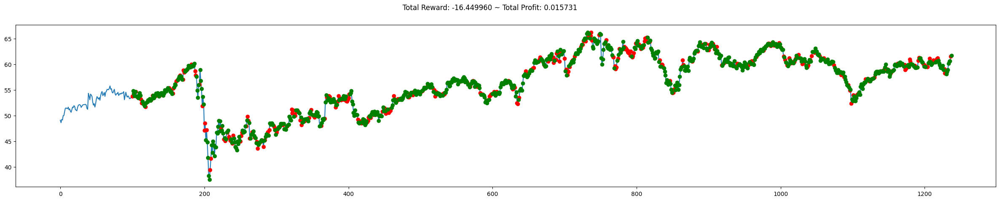

 10%|█         | 1/10 [00:25<03:45, 25.07s/it]

Total reward accumulated during the test: 13.200033999999938


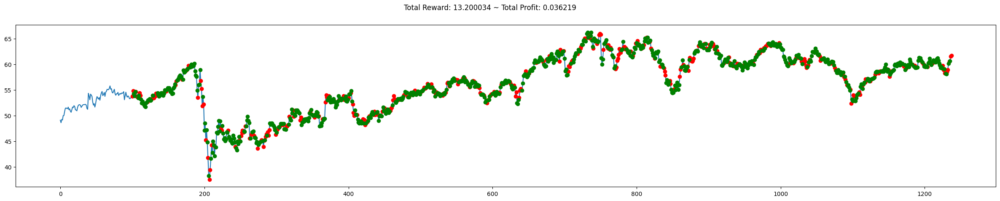

 20%|██        | 2/10 [00:47<03:09, 23.72s/it]

Total reward accumulated during the test: 17.349955000000065


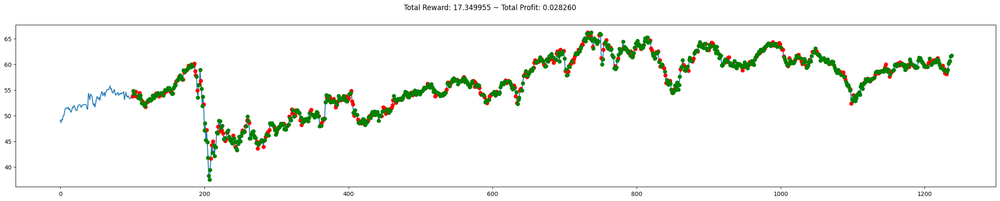

 30%|███       | 3/10 [01:10<02:42, 23.19s/it]

Total reward accumulated during the test: 9.685003000000052


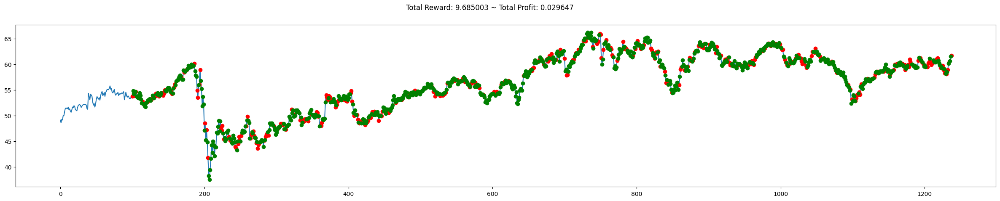

 40%|████      | 4/10 [01:33<02:17, 22.98s/it]

Total reward accumulated during the test: 17.959954999999965


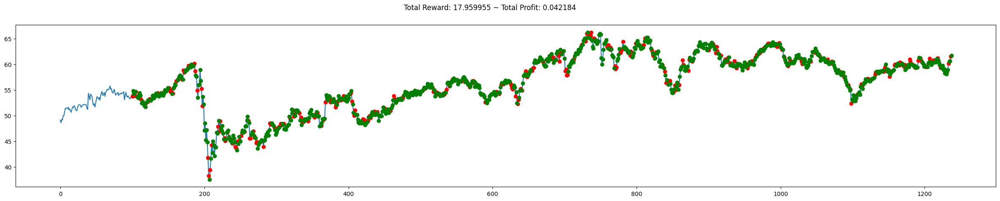

 50%|█████     | 5/10 [01:55<01:53, 22.73s/it]

Total reward accumulated during the test: 3.5350170000000176


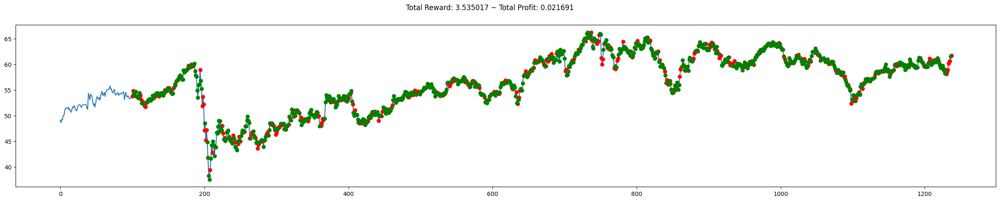

 60%|██████    | 6/10 [02:17<01:30, 22.63s/it]

Total reward accumulated during the test: -19.419974000000117


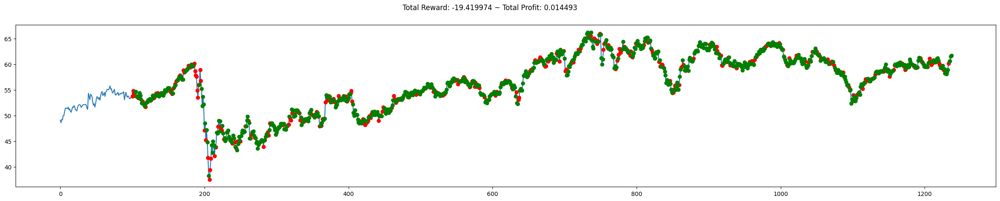

 70%|███████   | 7/10 [02:39<01:06, 22.29s/it]

Total reward accumulated during the test: 17.295006999999963


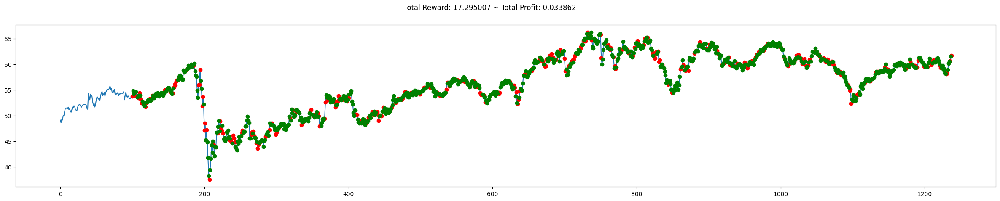

 80%|████████  | 8/10 [03:01<00:44, 22.33s/it]

Total reward accumulated during the test: 9.354983999999924


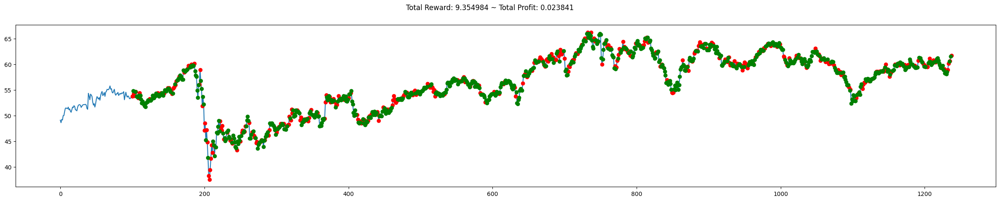

 90%|█████████ | 9/10 [03:25<00:22, 22.64s/it]

Total reward accumulated during the test: -8.419995


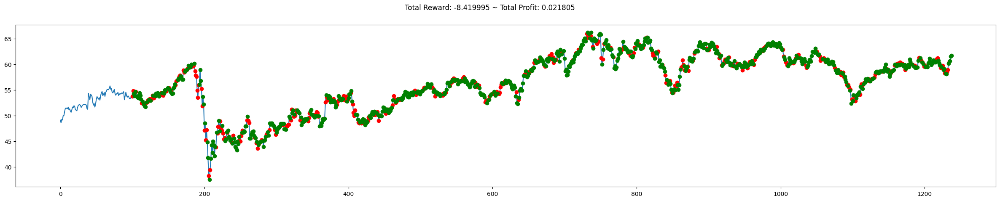

100%|██████████| 10/10 [03:48<00:00, 22.83s/it]


In [ ]:
evla_custom_model(env_test, actor)